<a href="https://colab.research.google.com/github/MasoudMoeini/Google-Street-View-Images-Blur-Detection/blob/main/New_SVIBDN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential, Model,load_model
from keras.optimizers import gradient_descent_v2 
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform

In [2]:
!unzip -qq images.zip

In [3]:
!unzip -qq labels.zip

In [2]:
from PIL import Image
from numpy import *
images_folder= "images/*.jpg"
labels_folder = "labels/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  class_label=[]
  label = []
  files = glob.glob (images_folder)
  for myFile in files[:8000]:
      image_name=os.path.split(myFile)[1]
      class_label.append(float(image_name[0]))
      image = array(Image.open(myFile))
      label_image = array(Image.open(labels_folder+image_name))
      label.append (label_image)
      total_img.append (image)
  total_img = np.array(total_img)
  label = np.array(label)
  class_label=np.array(class_label) 
  label= np.reshape(label,[label.shape[0],label.shape[1],label.shape[2],label.shape[3]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  #np.save('class_labels', class_label)
  #np.save('total-images',total_img)
  #np.save('label-images',label)
  return class_label,label,total_img

In [3]:
class_labels,total_labels,total_images=data_preprocessing(images_folder,labels_folder)

In [ ]:
total_images.shape

(8000, 224, 224, 3)

In [ ]:
total_labels.shape

(8000, 224, 224, 3)

In [ ]:
class_labels.shape

(8000,)

In [4]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [5]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [6]:
def decoder_network(X):
    #x_input = layers.Input(shape=(147))
    #x = keras.layers.Reshape([7,7,3])(dX)
    x = layers.Conv2DTranspose(2048, (3, 3), strides=2, activation="relu", padding="same")(X)
    x = layers.Conv2DTranspose(512, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="sigmoid", padding="same")(x)
    output = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="sigmoid", padding="same")(x)
    #model = Model(inputs=X, outputs=output, name='decoder_network')
    return output


In [7]:
def ResNet50():
    #X_input = keras.Input(shape=(224, 224, 3))
    X_input = layers.Input(shape=(224, 224, 3))
    #X = data_augmentation(X_input)
    #X = layers.Rescaling(1./255)(X)
    X = ZeroPadding2D((3, 3))(X_input)
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')
    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')
    #7*7*2048
    output1=decoder_network(X)
    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    X = Flatten()(X)
    X = Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(X)
    X = Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(X)
    output2 = Dense( 1,activation='sigmoid', name='fc3',kernel_initializer=glorot_uniform(seed=0))(X)
    model = Model(inputs=X_input, outputs=[output1,output2] , name='ResNet50')
    #return output1,output2
    return model

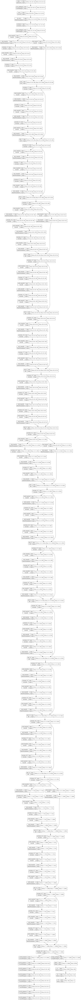

In [8]:
model= ResNet50()
keras.utils.plot_model(model, show_shapes=True)

In [9]:
class_label=class_labels[:7000]
x_train = total_images[:7000].astype(np.float32)/ 255.0
y_train=total_labels[:7000].astype(np.float32)/ 255.0
y_train = ( y_train,class_label)

In [10]:
unique, counts = np.unique(class_label, return_counts=True)

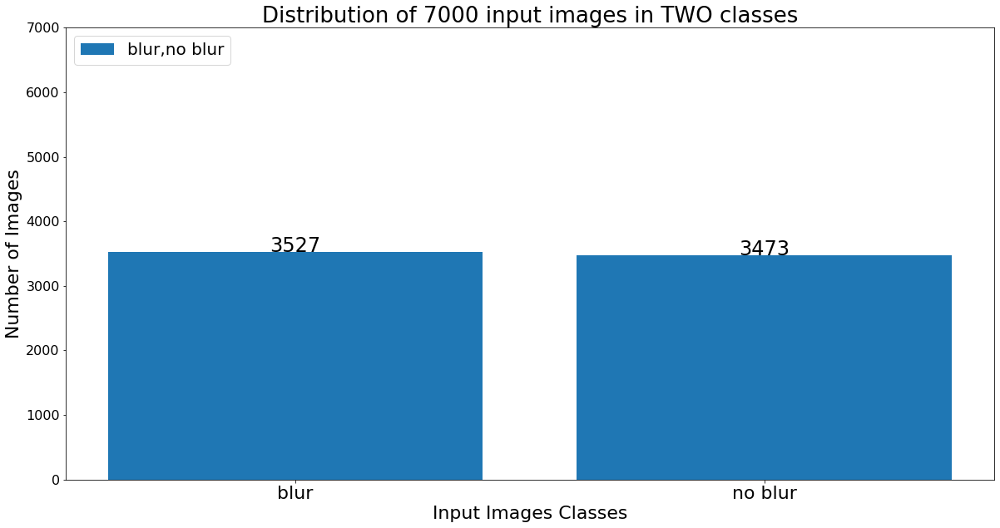

In [11]:
import matplotlib.pyplot as plt
def addlabels(x,y):
	for i in range(len(x)):
		plt.text(i,y[i],y[i],fontsize=24, ha='center')
if __name__ == '__main__':
	# creating data on which bar chart will be plot
	x = ['blur','no blur']
	y = [counts[0],counts[1]]
plt.figure(figsize=(20,10))
plt.bar(x, y,label='blur,no blur')
addlabels(x, y)
plt.title(f"Distribution of {(class_label.shape)[0]} input images in TWO classes",fontsize=26)
plt.xlabel('Input Images Classes',fontsize=22)
plt.ylabel('Number of Images',fontsize=22)
plt.yticks(np.arange(0, 8000,1000),fontsize=16)
plt.xticks(fontsize=22)
plt.gca().legend(prop={'size': 20},loc='upper left',fontsize=20)
plt.show()

In [12]:
loss1=tf.keras.losses.MeanSquaredError()
loss2="binary_crossentropy"
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_fc3_accuracy',verbose=1,mode="max",min_delta=0,patience=100,baseline=0.97)
#early_stopping = EarlyStopping(monitor='val_fc3_loss', baseline=0.119,mode="min", patience=10,verbose=1)
model.compile(keras.optimizers.Adam(learning_rate=1e-3),loss = [loss1,loss2],metrics=["accuracy"])

In [13]:
history = model.fit(x_train,[y_train[0],y_train[1]], epochs=60,batch_size=20, validation_split=0.2, callbacks=[early_stopping],shuffle=True)
model.save('new_model.h5')

Epoch 1/60
280/280 [==============================] - 86s 279ms/step - loss: 1.5633 - conv2d_transpose_7_loss: 0.1168 - fc3_loss: 1.4465 - conv2d_transpose_7_accuracy: 0.8829 - fc3_accuracy: 0.5136 - val_loss: 0.7749 - val_conv2d_transpose_7_loss: 0.0803 - val_fc3_loss: 0.6946 - val_conv2d_transpose_7_accuracy: 0.9670 - val_fc3_accuracy: 0.4914
Epoch 2/60
280/280 [==============================] - 76s 271ms/step - loss: 0.7336 - conv2d_transpose_7_loss: 0.0788 - fc3_loss: 0.6549 - conv2d_transpose_7_accuracy: 0.9523 - fc3_accuracy: 0.6455 - val_loss: 1.0499 - val_conv2d_transpose_7_loss: 0.0798 - val_fc3_loss: 0.9700 - val_conv2d_transpose_7_accuracy: 0.9591 - val_fc3_accuracy: 0.5221
Epoch 3/60
280/280 [==============================] - 76s 271ms/step - loss: 0.3638 - conv2d_transpose_7_loss: 0.0778 - fc3_loss: 0.2860 - conv2d_transpose_7_accuracy: 0.8881 - fc3_accuracy: 0.8721 - val_loss: 2.7867 - val_conv2d_transpose_7_loss: 0.0804 - val_fc3_loss: 2.7063 - val_conv2d_transpose_7_acc

In [14]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss', 'conv2d_transpose_7_loss', 'fc3_loss', 'conv2d_transpose_7_accuracy', 'fc3_accuracy', 'val_loss', 'val_conv2d_transpose_7_loss', 'val_fc3_loss', 'val_conv2d_transpose_7_accuracy', 'val_fc3_accuracy'])


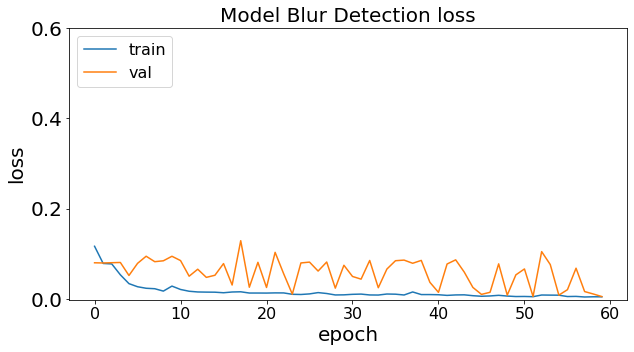

In [15]:
plt.figure(figsize=(10,5))
plt.plot(history.history['conv2d_transpose_7_loss'])
plt.plot(history.history['val_conv2d_transpose_7_loss'])
plt.title('Model Blur Detection loss',fontsize=20)
plt.ylabel('loss',fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.yticks(np.arange(0,0.8, 0.2),fontsize=20)
plt.xticks(fontsize=16)
plt.legend(['train', 'val'], loc='upper left',fontsize=16)
plt.show()

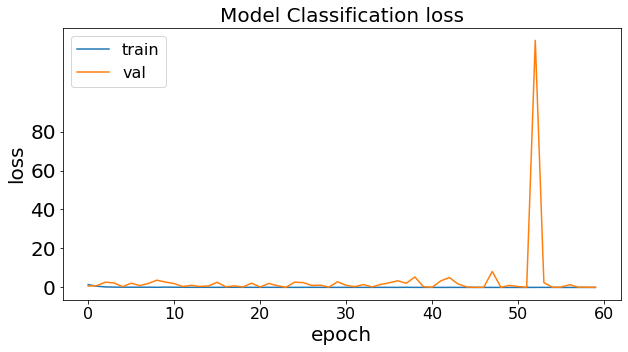

In [19]:
plt.figure(figsize=(10,5))
plt.plot(history.history['fc3_loss'])
plt.plot(history.history['val_fc3_loss'])
plt.title('Model Classification loss',fontsize=20)
plt.ylabel('loss',fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.yticks(np.arange(0,100,20),fontsize=20)
plt.xticks(fontsize=16)
plt.legend(['train', 'val'], loc='upper left',fontsize=16)
plt.show()

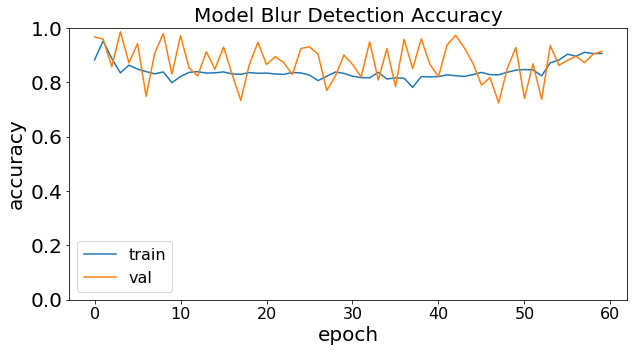

In [65]:
plt.figure(figsize=(10,5))
plt.plot(history.history['conv2d_transpose_7_accuracy'])
plt.plot(history.history['val_conv2d_transpose_7_accuracy'])
plt.title('Model Blur Detection Accuracy',fontsize=20)
plt.ylabel('accuracy',fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.yticks(np.arange(0,1.2,0.2),fontsize=20)
plt.xticks(fontsize=16)
plt.legend(['train', 'val'], loc='lower left',fontsize=16)
plt.show()

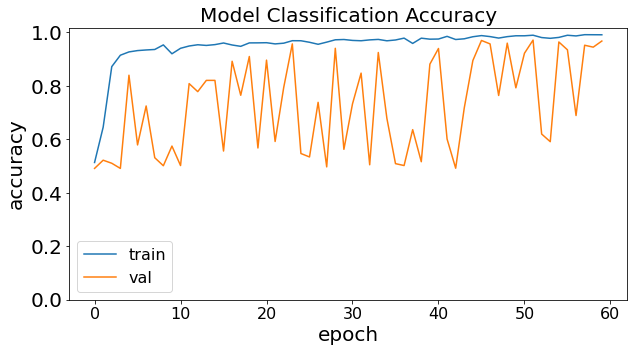

In [66]:
plt.figure(figsize=(10,5))
plt.plot(history.history['fc3_accuracy'])
plt.plot(history.history['val_fc3_accuracy'])
plt.title('Model Classification Accuracy',fontsize=20)
plt.ylabel('accuracy',fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.yticks(np.arange(0,1.2,0.2),fontsize=20)
plt.xticks(fontsize=16)
plt.legend(['train', 'val'], loc='lower left',fontsize=16)
plt.show()

In [20]:
#evaluation images
eval_images=total_images[7000:]
eval_labels=total_labels[7000:]
eval_class_label=class_labels[7000:]

In [21]:
from keras.models import load_model
from PIL import Image
#images = np.load('test-blurry-images.npy')
images = eval_images
model = load_model("new_model.h5")
predictions=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

In [22]:
len(predictions)

1000

In [53]:
y_pred_class=[]
for i in range(len(predictions)):
  predicted_class=(((predictions[i])[1])[0])[0]
  if (predicted_class>0.5):
    predicted_class=1.0
  else:
    predicted_class=0.0
  y_pred_class.append(predicted_class)
y_pred_class=np.array(y_pred_class)

## Confusion Matrix

In [54]:
from sklearn.metrics import classification_report, confusion_matrix
conf_m = confusion_matrix(eval_class_label, y_pred_class)
conf_m

array([[465,  16],
       [ 14, 505]])

In [25]:
report = classification_report(eval_class_label, y_pred_class)
print(report)

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       481
         1.0       0.97      0.97      0.97       519

    accuracy                           0.97      1000
   macro avg       0.97      0.97      0.97      1000
weighted avg       0.97      0.97      0.97      1000



## Intersection over Union

In [44]:
def get_iou_score(predictions,eval_labels):
  iou_scores=[]
  for i in range(len(predictions)):
    true_label = eval_labels[i]/255.0
    y_pred_label = np.where((((predictions[i])[0])[0])>0.5,1.0,0.0)
    #y_pred_label= ((((predictions[i])[0])[0])*255.0).astype(np.uint8)
    #iou = true_positives / (true_positives + false_positives + false_negatives)
    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(true_label, y_pred_label)
    iou_scores.append(m.result().numpy())
    #intersection = np.logical_and(true_label, y_pred_label)
    #union = np.logical_or(true_label, y_pred_label)
    #iou_score = np.sum(intersection) / np.sum(union)
    #iou_scores.append(iou_score)
  return mean(iou_scores)

In [45]:
iou_score = get_iou_score(predictions,eval_labels)

In [47]:
print('Average Intersection over Union IoU for Blur Detection: ',iou_score )

Average Intersection over Union IoU for Blur Detection:  0.917568


In [68]:
from statistics import mean
mse_blurDetection=[]
kld_blurDetection=[]
kl = tf.keras.losses.KLDivergence()
#bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
#BCE_C= bce(eval_class_label, y_pred_class).numpy()
mse = tf.keras.losses.MeanSquaredError()
MSE_C= mse(eval_class_label, y_pred_class).numpy()
for i in range((images.shape)[0]):
  true_img_label = eval_labels[i]/ 255.0
  img_pred_label= ((predictions[i])[0])[0]

  #mse blur detection
  sb= np. subtract(img_pred_label, true_img_label)
  sq= np. square(sb)
  mseBd = sq.mean()
  mse_blurDetection.append(mseBd)
  kld_blurDetection.append(kl(true_img_label,img_pred_label).numpy())
MSE_BD=mean(mse_blurDetection)
KLD_BD=mean(kld_blurDetection)
print(f" MSE for Model Blur area detection: {MSE_BD}")
print(f" MSE for Model Classification: {MSE_C}")
print(f" KLD for Model Blur area detection: {KLD_BD}")

 MSE for Model Blur area detection: 0.006449321146841354
 MSE for Model Classification: 0.029999999329447746
 KLD for Model Blur area detection: 0.04686097428202629


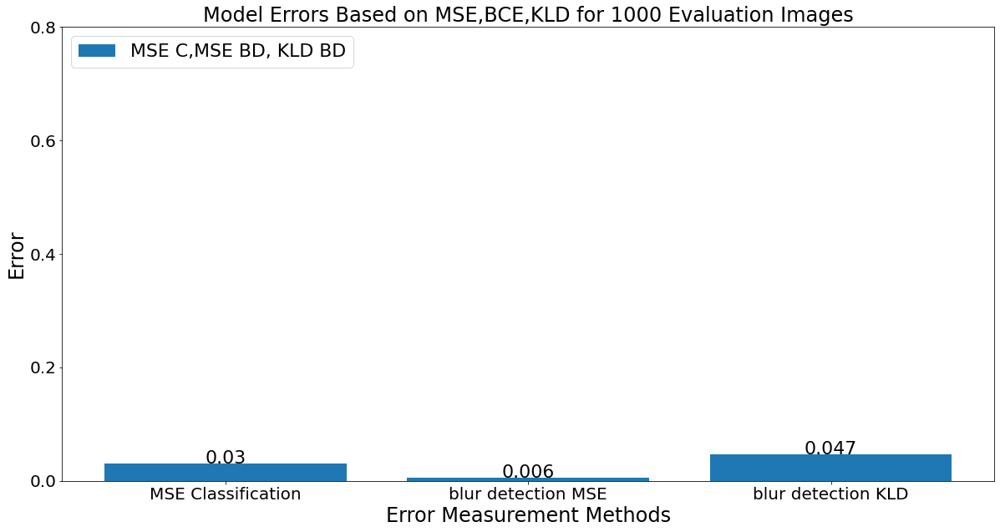

In [70]:
import matplotlib.pyplot as plt
def addlabels(x,y):
	for i in range(len(x)):
		plt.text(i,y[i],y[i],fontsize=22, ha='center')

if __name__ == '__main__':
	# creating data on which bar chart will be plot
	x = ['MSE Classification','blur detection MSE','blur detection KLD']
	y = [MSE_C, MSE_BD,abs (KLD_BD)]
	y= np.around(y,decimals=3)
 #[MSE_C,MSE_BD,BCE_C,abs (KLD_BD)]
plt.figure(figsize=(20,10))
plt.bar(x, y,label='MSE C,MSE BD, KLD BD')
addlabels(x, y)
plt.title(f"Model Errors Based on MSE,BCE,KLD for {(images.shape)[0]} Evaluation Images",fontsize=24)
plt.xlabel('Error Measurement Methods',fontsize=24)
plt.ylabel('Error',fontsize=24)
plt.yticks(np.arange(0,1,0.2),fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.gca().legend(prop={'size': 22},loc='upper left')
plt.show()


predicted class vs true class


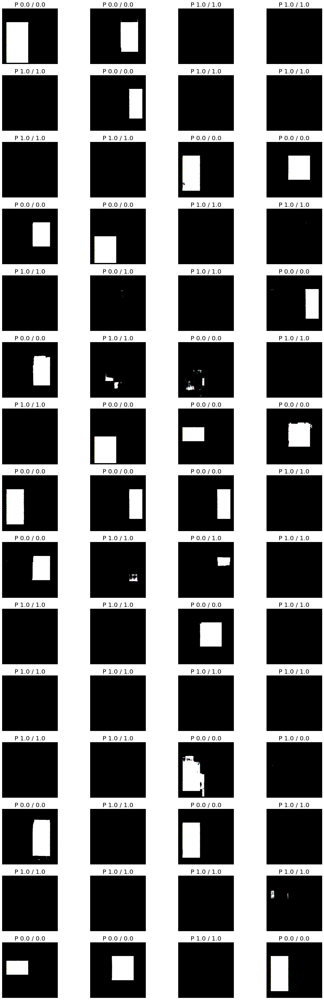

In [31]:

columns = 4
rows = 15
print("predicted class vs true class")
fig = plt.figure(figsize=(20,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where((((predictions[i])[0])[0])>0.5,1.0,0.0)
  plt.imshow((img_pred_label*255.0).astype(np.uint8))
  predicted_class=(((predictions[i])[1])[0])[0]
  if (predicted_class>0.5):
    predicted_class=1.0
  else:
    predicted_class=0.0
  plt.title(f"P {predicted_class} / {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


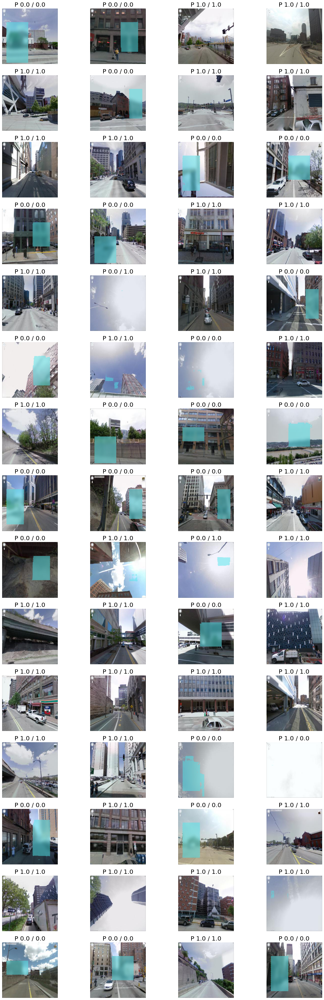

In [32]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
print("predicted class vs true class")
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where((((predictions[i])[0])[0])>0.5,1.0,0.0)
  mask=(img_pred_label*255.0).astype(np.uint8)
  blackFrame = np.zeros((224,224, 3), dtype = "uint8")
  whiteFrame = 255 * np.ones((224,224,3), np.uint8)
  #label_img = Image.fromarray(label_img)
  mask = np.where(mask==255,whiteFrame,blackFrame)
  img= images[i]
  cyan = np.full_like(img,(80, 229, 235))
  blend = 0.5
  img_cyan = cv2.addWeighted(img, blend, cyan, 1-blend, 0)
  mask = np.where(mask>=165,img_cyan,img)
  #mask =cv2.cvtColor(mask , cv2.COLOR_BGR2RGB)
  plt.imshow(mask,cmap='binary')
  #mask = Image.fromarray(mask)
  predicted_class=(((predictions[i])[1])[0])[0]
  if (predicted_class>0.5):
    predicted_class=1.0
  else:
    predicted_class=0.0
  plt.title(f"P {predicted_class} / {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

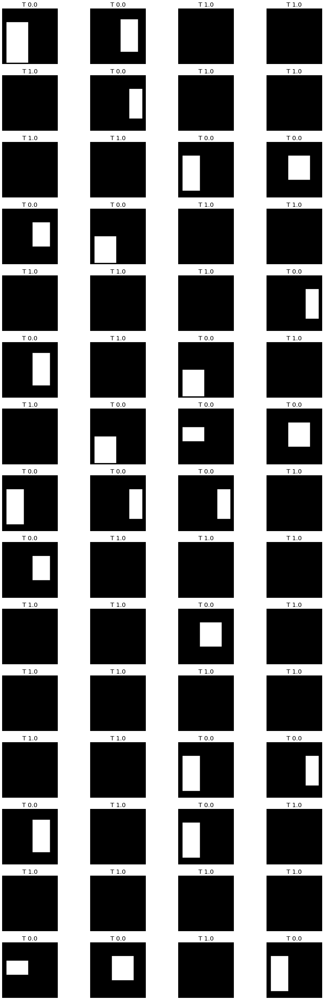

In [33]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='binary')
  plt.title(f"T {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

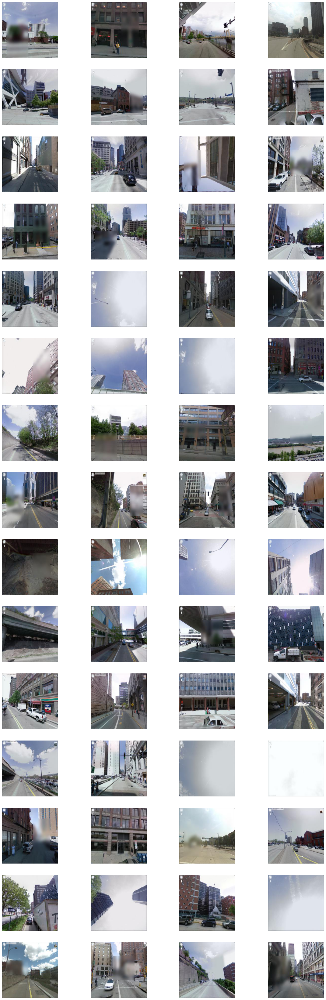

In [34]:
#images = np.load('test-label-images.npy')
#images = images[0:100]
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(images[i],cmap='binary')
  plt.axis("off")
plt.show()

In [35]:
from google.colab import files
files.download('new_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>